In [17]:
from pathlib import Path

import numpy as np
import pandas as pd

from tqdm import tqdm

tqdm.pandas()

In [18]:
DATASET_DIR = "../dataset"
DATASET_NAME = "label_medium_articles.parquet"
DATASET_PATH = Path(DATASET_DIR) / DATASET_NAME

assert Path(DATASET_PATH).exists(), "Dataset not found."

df = pd.read_parquet(DATASET_PATH)

In [19]:
df.count()

title        184477
text         184478
url          184478
authors      184478
timestamp    184476
tags         184478
label        184478
score        184478
clusters     184478
dtype: int64

In [20]:
df["text_length"] = df["text"].progress_apply(len)
df.head(5)


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 184478/184478 [00:00<00:00, 1267180.38it/s]


,title,text,url,authors,timestamp,tags,label,score,clusters,text_length
0,Mental Note Vol. 24,Photo by Josh Riemer on Unsplash Merry Christ...,https://medium.com/invisible-illness/mental-no...,['Ryan Fan'],2020-12-26 03:38:10.479000+00:00,"['Mental Health', 'Health', 'Psychology', 'Sci...",en,0.964118,"[253, 251]",5018
1,Your Brain On Coronavirus,Your Brain On Coronavirus A guide to the curi...,https://medium.com/age-of-awareness/how-the-pa...,['Simon Spichak'],2020-09-23 22:10:17.126000+00:00,"['Mental Health', 'Coronavirus', 'Science', 'P...",en,0.962439,[253],7293
2,Mind Your Nose,Mind Your Nose How smell training can change ...,https://medium.com/neodotlife/mind-your-nose-f...,[],2020-10-10 20:17:37.132000+00:00,"['Biotechnology', 'Neuroscience', 'Brain', 'We...",en,0.957879,[251],5730
3,The 4 Purposes of Dreams,Passionate about the synergy between science a...,https://medium.com/science-for-real/the-4-purp...,['Eshan Samaranayake'],2020-12-21 16:05:19.524000+00:00,"['Health', 'Neuroscience', 'Mental Health', 'P...",en,0.915634,"[251, 253]",146
4,Surviving a Rod Through the Head,"You ve heard of him, haven t you Phineas Gage...",https://medium.com/live-your-life-on-purpose/s...,['Rishav Sinha'],2020-02-26 00:01:01.576000+00:00,"['Brain', 'Health', 'Development', 'Psychology...",en,0.914334,[251],2326


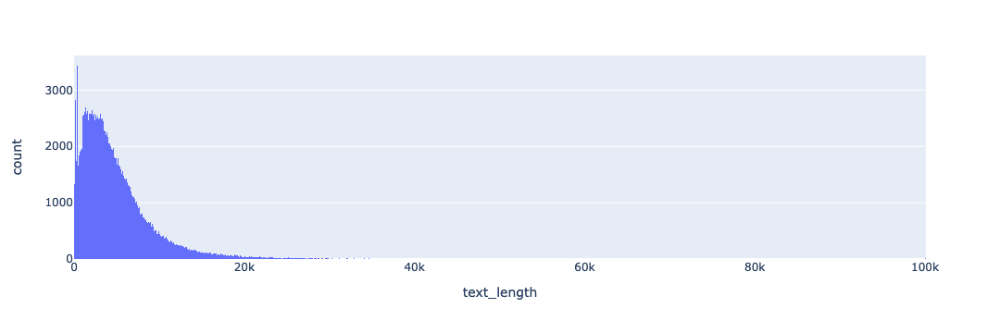

In [5]:
import plotly.express as px

fig = px.histogram(df, x="text_length")
fig.show()

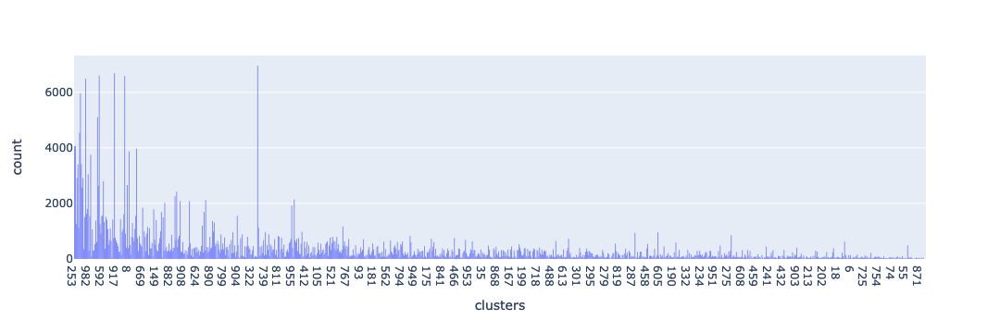

In [24]:
import plotly.express as px

clusters = []
for _, row in df.iterrows():
    clusters.extend(row["clusters"])
    
fig = px.histogram({"clusters": clusters}, x="clusters")
fig.show()

In [7]:
df["text_length"].median()

3842.0

In [8]:
cluster_label_path = Path(DATASET_DIR) / "cluster_label.parquet"
cluster_label_df = pd.read_parquet(cluster_label_path)

In [9]:
import re

from typing import List, Tuple, Dict

import torch

from torch.utils.data import Dataset, DataLoader
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    BasicTokenizer,
    AdamW,
    get_linear_schedule_with_warmup,
)

from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.model_selection import train_test_split


class MultiLabelDataset(Dataset):
    def __init__(
        self,
        data: pd.Series,
        labels: List[int],
        tokenizer: BasicTokenizer,
        max_seq_length: int = 512,
    ) -> None:
        self.data = data
        self.labels = torch.tensor(labels, dtype= torch.float)
        self.tokenizer = tokenizer
        self.max_seq_length = max_seq_length
        self.input_ids, self.attention_mask = self._get_features(self.data)
        
    def _get_features(self, data: pd.Series) -> Tuple[torch.Tensor]:
        features = self.tokenizer(
            data.tolist(),
            max_length=self.max_seq_length,
            padding="max_length",
            truncation=True,
            return_attention_mask=True,
            return_tensors="pt",
        )
        return features["input_ids"], features["attention_mask"]
        

    def __getitem__(self, index: int) -> Dict[str, torch.Tensor]:
        return {
            "input_ids": self.input_ids[index] ,
            "attention_mask": self.attention_mask[index],
            "labels": self.labels[index],
        }

    def __len__(self) -> int:
        return self.data.count()

In [10]:
import re

from typing import Any, Union, List, Callable, Tuple, Optional

import torch
import pytorch_lightning as pl

from torch.utils.data import Dataset, DataLoader
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    BasicTokenizer,
    AdamW,
    get_linear_schedule_with_warmup,
)

    

class ArticleTagsDataModule(pl.LightningDataModule):
    def __init__(
        self,
        model_name_or_path: str,
        dataset_path: str,
        max_seq_length: int = 512,
        train_batch_size: int = 32,
        eval_batch_size: int = 32,
        test_size: float = 0.2,
        **kwargs: Any,
    ) -> None:
        super().__init__()
        self.mlb = MultiLabelBinarizer()
        self.tokenizer = AutoTokenizer.from_pretrained(model_name_or_path)
        self.dataset = pd.read_parquet(dataset_path, columns=["text", "clusters"])
        self.dataset["text"] = self.dataset["text"].progress_apply(self._clean_space)
        self.max_seq_length = max_seq_length
        self.train_batch_size = train_batch_size
        self.eval_batch_size = eval_batch_size
        self.test_size = test_size
        
    def _clean_space(self, text: str) -> str:
        return re.sub(r"\s+", " ", text)
        
    def setup(self, stage: str):
        self.mlb.fit(self.dataset["clusters"])
        train_df, val_df = train_test_split(self.dataset, test_size=self.test_size)
        train_df, test_df = train_test_split(train_df, test_size=self.test_size)
        train_labels = self.mlb.transform(train_df["clusters"])
        val_labels = self.mlb.transform(val_df["clusters"])
        test_labels = self.mlb.transform(test_df["clusters"])
        self.train_dataset = MultiLabelDataset(
            train_df["text"],
            train_labels,
            self.tokenizer,
            self.max_seq_length,
        )
        self.val_dataset = MultiLabelDataset(
            val_df["text"],
            val_labels,
            self.tokenizer,
            self.max_seq_length,
        )
        self.test_dataset = MultiLabelDataset(
            test_df["text"],
            test_labels,
            self.tokenizer,
            self.max_seq_length,
        )
    
    @property
    def label_classes(self) -> List[str]:
        return self.mlb.classes_
         
    def val_dataloader(self):
        return DataLoader(self.val_dataset, batch_size=self.eval_batch_size)

    def train_dataloader(self):
        return DataLoader(self.train_dataset, batch_size=self.train_batch_size, shuffle=True)
    
    def test_dataloader(self):
        return DataLoader(self.test_dataset, batch_size=self.eval_batch_size)

In [11]:
import torchmetrics

class ArticleTagsClassifier(pl.LightningModule):
    def __init__(
        self,
        model_name_or_path: str,
        label_classes: List[str],
        steps_per_epoch: Optional[int] = None,
        n_epochs: int = 3,
        lr: float = 2e-5,
    ) -> None:
        super().__init__()
        self.save_hyperparameters()
        self.steps_per_epoch = steps_per_epoch
        self.n_epochs = n_epochs
        self.lr = lr
        self.id2label = {idx: label for idx, label in enumerate(label_classes)}
        self.label2id = {label: idx for idx, label in enumerate(label_classes)}
        self.num_labels = len(label_classes)
        self.model = AutoModelForSequenceClassification.from_pretrained(
            model_name_or_path,
            num_labels=self.num_labels,
            id2label=self.id2label,
            label2id=self.label2id,
            problem_type="multi_label_classification",
        )
        self.f1 = torchmetrics.F1Score(task="multilabel", num_labels=self.num_labels)
        self.t_acc = torchmetrics.Accuracy(task="multilabel", num_labels=self.num_labels)
        self.t_f1 = torchmetrics.F1Score(task="multilabel", num_labels=self.num_labels)
        self.v_acc = torchmetrics.Accuracy(task="multilabel", num_labels=self.num_labels)
        self.v_f1 = torchmetrics.F1Score(task="multilabel", num_labels=self.num_labels)
        
    def forward(self, **inputs: Any) -> Any:
        return self.model(**inputs)
    
    def training_step(self, batch: Tuple[List[int], List[int]], batch_idx: int) -> float:
        outputs = self(**batch)
        loss = outputs.loss
        preds = torch.sigmoid(outputs.logits)
        labels = batch["labels"]
        self.log("train_loss", loss)
        self.f1(preds, labels)
        self.log("train_f1", self.f1, on_step=True, on_epoch=False, prog_bar=True)
        return loss
    
    def test_step(self, batch: Tuple[List[int], List[int]], batch_idx: int) -> float:
        outputs = self(**batch)
        loss, logits = outputs[:2]
        preds = torch.sigmoid(logits)
        labels = batch["labels"]
        self.log("test_loss", loss)
        self.t_acc.update(preds, labels)
        self.t_f1.update(preds, labels)
        return {"loss": loss, "preds": preds, "labels": labels}
    
    def test_epoch_end(self, outputs):
        self.log("test_acc", self.t_acc.compute(), on_step=False, on_epoch=True, prog_bar=True)
        self.log("test_f1", self.t_f1.compute(), on_step=False, on_epoch=True, prog_bar=True)
        self.t_acc.reset()
        self.t_f1.reset()
    
    def validation_step(self, batch: Tuple[List[int], List[int]], batch_idx: int) -> float:
        outputs = self(**batch)
        val_loss, logits = outputs[:2]
        preds = torch.sigmoid(logits)
        labels = batch["labels"]
        self.log("val_loss", val_loss)
        self.v_acc.update(preds, labels)
        self.v_f1.update(preds, labels)
        return {"loss": val_loss, "preds": preds, "labels": labels}
    
    def validation_epoch_end(self, outputs):
        self.log("valid_acc", self.v_acc.compute(), on_step=False, on_epoch=True, prog_bar=True)
        self.log("valid_f1", self.v_f1.compute(), on_step=False, on_epoch=True, prog_bar=True)
        self.v_acc.reset()
        self.v_f1.reset()
    
    def configure_optimizers(self):
        param_optimizer = list(self.named_parameters())
        no_decay = ['bias', 'gamma', 'beta']
        optimizer_grouped_parameters = [
            {'params': [p for n, p in param_optimizer if not any(nd in n for nd in no_decay)],
             'weight_decay_rate': 0.01},
            {'params': [p for n, p in param_optimizer if any(nd in n for nd in no_decay)],
             'weight_decay_rate': 0.0}
        ]
        optimizer = AdamW(optimizer_grouped_parameters , lr=self.lr, correct_bias=True)
        warmup_steps = self.steps_per_epoch//3
        total_steps = self.steps_per_epoch * self.n_epochs - warmup_steps

        scheduler = get_linear_schedule_with_warmup(optimizer,warmup_steps,total_steps)

        return [optimizer], [scheduler]

In [12]:
from collections import defaultdict

cluster_temp_df = cluster_label_df
cluster_label_map = defaultdict(lambda: [])

for _, row in cluster_temp_df.iterrows():
    cluster_label_map[row["cluster"]].append(row["label"])

In [13]:
# import torch
# device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model_name = "bert-base-uncased"
pl_dataset = ArticleTagsDataModule(
    model_name_or_path=model_name,
    dataset_path=DATASET_PATH,
    max_seq_length=512,
    train_batch_size=12,
    eval_batch_size=8,
    test_size=0.2,
)
pl_dataset.setup("fit")

model_path = "../checkpoints/lightning_logs/model_fit.ckpt"
if Path(model_path).exists():
    pl_model = ArticleTagsClassifier.load_from_checkpoint(model_path)
else:
    pl_model = ArticleTagsClassifier(
        model_name_or_path=model_name,
        label_classes=pl_dataset.label_classes,
        steps_per_epoch=3000 // 12
    )
    
pl_dataset.label_classes.shape

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 184478/184478 [00:23<00:00, 7915.98it/s]
Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.predictions.transform.dense.weight', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSeq

(1000,)

In [14]:
from pytorch_lightning.callbacks.early_stopping import EarlyStopping
from pytorch_lightning.callbacks import ModelCheckpoint

early_stop_callback = EarlyStopping(
    monitor="val_loss",
    patience=3,
    mode="min",
)
acc_checkpoint_callback = ModelCheckpoint(
    monitor="val_loss",
    filename="aac_{epoch}-{val_loss:.2f}-{valid_acc:.2f}",
    save_top_k=5,
)
loss_checkpoint_callback = ModelCheckpoint(
    monitor="valid_f1",
    filename="loss_{epoch}-{val_loss:.2f}-{valid_f1:.2f}",
    save_top_k=5,
)

trainer = pl.Trainer(
    max_epochs=50,
    limit_train_batches=1000,
    limit_test_batches=500,
    accelerator="gpu",
    devices=1,
    default_root_dir="../checkpoints",
    callbacks=[early_stop_callback, loss_checkpoint_callback, acc_checkpoint_callback],
    reload_dataloaders_every_n_epochs=5,
)
trainer.fit(
    pl_model,
    datamodule=pl_dataset,
)
trainer.save_checkpoint(model_path)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/ntub/Documents/190k-medium-articles/.venv/lib/python3.9/site-packages/transformers/optimization.py:306: FutureWarning:

This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning


  | Name  | Type                          | Params
--------------------------------------------------------
0 | model | BertForSequenceClassification | 110 M 
1 | f1    | MultilabelF1Score             | 0     
2 | t_acc | MultilabelAccuracy            | 0     
3 | t_f1  | MultilabelF1Score             | 0     
4 | v_acc | MultilabelAccuracy            | 0     
5 | v_f1  | MultilabelF1Score             | 0     
--------------------------------------------------------
110 

Sanity Checking: 0it [00:00, ?it/s]

/home/ntub/Documents/190k-medium-articles/.venv/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:224: PossibleUserWarning:

The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/home/ntub/Documents/190k-medium-articles/.venv/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:224: PossibleUserWarning:

The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 12 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.



Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

/home/ntub/Documents/190k-medium-articles/.venv/lib/python3.9/site-packages/pytorch_lightning/trainer/call.py:48: UserWarning:

Detected KeyboardInterrupt, attempting graceful shutdown...



In [15]:
trainer.save_checkpoint(model_path)

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
t_tokenizer = AutoTokenizer.from_pretrained(model_name)
t_text = df.iloc[0]["text"]
t_features = t_tokenizer(
    [t_text],
    max_length=512,
    padding="max_length",
    truncation=True,
    return_attention_mask=True,
    return_tensors="pt",
)
t_inputs = {
    "input_ids": t_features["input_ids"].to(device) ,
    "attention_mask": t_features["attention_mask"].to(device),
}

In [ ]:
outputs = pl_model(**t_inputs)

In [ ]:
print(df.iloc[0]["clusters"].tolist())
# [cluster_label_map[i] for i in df.iloc[0]["clusters"].tolist()]
# pl_dataset.mlb.transform([df.iloc[0]["clusters"].tolist()])[0]

In [ ]:
# ttd = next(iter(pl_dataset.train_dataloader()))
# ttd.keys()

In [ ]:
# outputs = pl_model(**pl_dataset.train_dataset[0])

In [ ]:
# oh_labels = pl_dataset.mlb.transform([df.iloc[0]["clusters"]])
# v_acc = torchmetrics.Accuracy(task="multilabel", num_labels=pl_model.num_labels)

In [ ]:
# p_data = torch.sigmoid(outputs.logits)
# labels = torch.tensor(oh_labels, dtype= torch.float)
# v_acc(p_data, labels)

In [ ]:
# pl_dataset.mlb.inverse_transform(p_data.detach().numpy())
# p_data[0]

In [ ]:
# sigmoid = torch.nn.Sigmoid()
# probs = sigmoid(outputs.logits.squeeze().cpu())
probs = outputs.logits.squeeze().sigmoid().detach().cpu().numpy()
predictions = np.zeros(probs.shape)
predictions[np.where(probs >= 0.5)] = 1

In [ ]:
predicted_labels = [pl_model.id2label[idx] for idx, label in enumerate(predictions) if label == 1.0]

In [ ]:
predicted_labels

In [ ]:
predictions